


<h1>Project quarter car<span class="tocSkip"></span></h1>



<div class="alert alert-block alert-success">


Tom Karaqi
    
<b>Result:</b>
    
| Task   |  1  |  2  |  3  |  4  |  5  |  6  |  7  |  8  |  9  |  10 |  Sum  |
|--------|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|--------
| Points | 2/2 | 2/2 | 1.5/2 | 1.5/2 | 1/1 | 3/3 | 3/3 | 2/2 | 1/1 | 2/2 | 19/20|

<b> Bemerkungen zur Korrektur </b>:

Starke Leistung!
    
- Task 3: Entweder v*f' oder $\dot f$, nicht $v*\dot f$. Wichtig für Prüfungen /Klausuren: Geben Sie immer auch explizit die Substitutionen an, also wie Sie die z's definieren.
- Task 4: 1s Fahrzeit entspricht einer Strecke von 0 bis v*1s=4m. Hab's in Ihrem Code korrigiert.
- Task 8: Hier können Sie sich das Leben leichter machen, indem Sie die DGL gleich mit den konkreten, numerischen Werten definieren. Das spart dann die ganzen "Subs". Ich habe Ihnen die alternative Implementation in Ihrer Funktion dargestellt.    
    
</div>

## Packages

<div class="alert alert-block alert-danger">
    
<b>Important: Do not import other packages or libraries!</b>
    
</div>

### Python

In [1]:
from platform import python_version
print('python version = '+ python_version())

python version = 3.11.7


### Display images and videos

In [2]:
from IPython.display import HTML, Image, IFrame, YouTubeVideo

### NumPy

In [3]:
import numpy as np
print('numpy version = '+ np.__version__)

numpy version = 1.26.4


### SymPy

In [4]:
import sympy as sp
print('sympy version = '+ sp.__version__)
sp.init_printing()

sympy version = 1.12


### Matplotlib

In [5]:
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
print('matplotlib version = '+ matplotlib.__version__)

matplotlib version = 3.8.0


### Google Colab
If you are using Google Colab mount drive and change directory.

In [6]:
if 'google.colab' in str(get_ipython()):
    print('Running on Google Colab')
    from google.colab import drive
    drive.mount('/content/gdrive')
    %cd '/content/gdrive/MyDrive/Colab Notebooks/Modelling and Simulation/quarter_car'
else:
    print('Not running on Google Colab')

Not running on Google Colab


## 1 Modelling
Vehicle dynamics describes the effect of forces on moving vehicles, such as cars.
In the simulation of vehicle dynamics, the behavior of a digital vehicle model is calculated by computer programs.
In this process, certain driving situations are performed virtually.
A realistic simulation requires a complex modelling of the parts installed in the vehicle.
Especially for tires, there are many different models for simulation.
Simulations are also used to optimize the design of the vehicle in terms of fuel consumption and environmental impact.

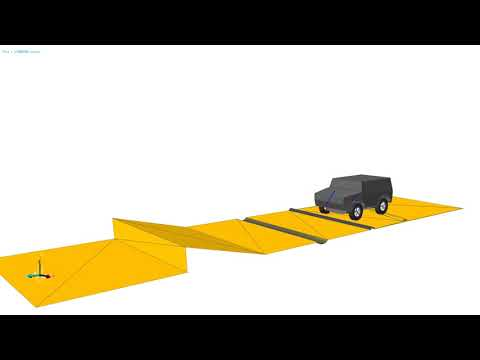

In [7]:
YouTubeVideo('656Unj19nww')

In this project a very simplified model is considered, where the vehicle consists of only one mass point, which is connected to a wheel via a spring-damper system.
In vehicle dynamics, this simplified model is called a quarter car suspension.
The aim is to simulate and visualize the vibration behavior of the spring-damper system.
Virtual test tracks with different road profiles are analysed.

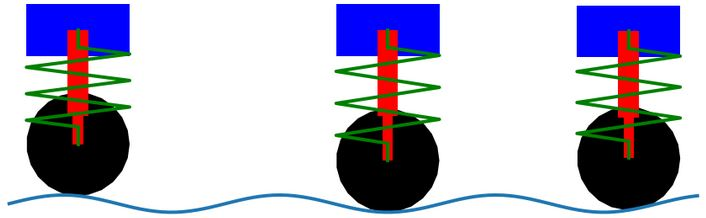

In [8]:
Image('quarter_car_coble_stones.jpg', width=353, height=109)

## 2 Numerical treatment
A mathematical description for both the test track and the spring-damper system is needed.

### 2.1 Coordinate system
The common coordinate system for the test track and the spring-damper system is defined in such a way that the rolling movement of the wheel is in the direction of the $x$-axis and the oscillation of the mass is perpendicular to this in the $y$-direction.
The position of the origin is at the point where the wheel touches the road surface at the beginning of the test track.
The vehicle drives in $x$-direction with constant speed $v$.

### 2.2 Test track
The vibration behaviour of the quarter vehicle is influenced by the mass $m$, which is ideally concentrated in one point.
The aim is to simulate the movement of this mass point.
Starting at time $t_0=0$ the time $t_{\mbox{max}}$ is required to run the test track.
At time $t$ the mass point is located at position

$$
\left(\, x(t) \mid y(t) \,\right), \quad t \in \left[t_0,t_1\right] \, .
$$

To describe the height of road profile at postion $x$ a function $f$ is used:

$$
f(x(t)), \quad t \in \left[t_0,t_1\right] \, .
$$

Since the movement starts at the origin, the function $f$ must fulfill the condition

$$
    f(0)=0.
$$

A simple approach is to simulate a rumble strip test track, represented by the function 

$$
    f(x) = A \, sin( \omega \, x) \, .
    \quad \quad (*)
$$

Here $\omega$ denotes the angular frequency and $A$ is used to specify the height of the rumble strips.   

### 2.3 Equation of motion
For a test track which, apart from a few bumps in the ground, runs horizontally, there is an approximate correlation at constant speed $v$:

$$
x(t) = v \, t, \quad \dot{x}(t) = v \, .
$$

The vertical deflection $y(t)$ of the idealized mass point as a function of time $t$ is not so easy to determine.
Depending on the profile of the test track, the mass oscillates around the equilibrium position, which is designated $y_0$.
The mass point is in the equilibrium position at the beginning of the test drive and the speed in $y$ direction is zero:

$$
y(0) = y_0, \quad \dot{y}(0) = 0.
$$

The aim is to determine a mathematical description of the movement of the mass point as a function of time.
This mathematical description results from the consideration of several physical laws.

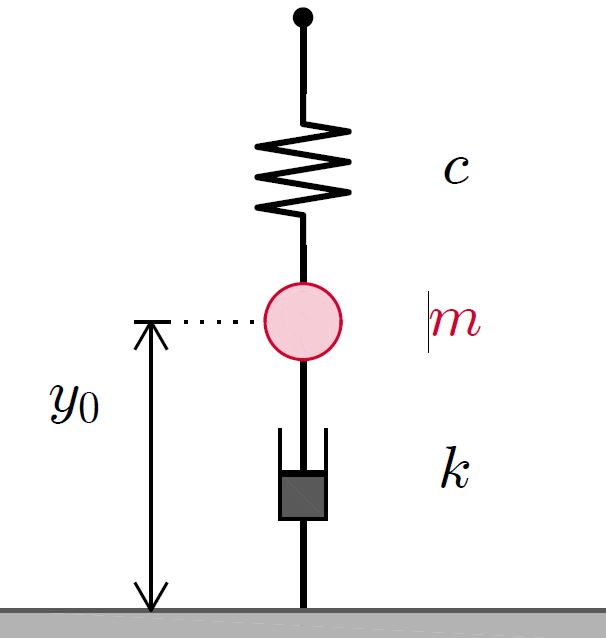

In [9]:
Image('quarter_car_mass_spring_damper.jpg', width=150, height=160)

<b>Spring</b>

According to Hooke's law, the distance of extension or compression of a spring is approximately proportional to the force acting on it.
The proportionality factor $c$ is called the characteristic of the spring.
For the spring force $F_{\mbox{spring}}$, which acts on the mass $m$ at time $t$, the following applies:

$$
F_{\mbox{spring}}(t) = - c \, \underbrace{ \left( y(t) - y_0 - f(x(t)) \right) }_{\mbox{vertical deflection}}.
$$

The vertical deflection at time $t$ depends on the vertical position $y$ of the mass $m$, the equilibrium position $y_0$ and the height of the road profile $f$.
The negative sign results from the fact that the spring force on the mass always acts against the direction of the deflection.

<b>Damper</b>

The damper creates a frictional force $F_{\mbox{damper}}$.
Because of the small speed of the movement in $y$ direction, we assume that the frictional force is proportional to the speed of the mass $m$ in vertical direction.
The proportionality factor $k$ is called damping coefficient.
The frictional force acts against the direction of movement, so the following applies:

$$
	F_{\mbox{damper}}(t)
	= - k \, \underbrace{ \frac{\mbox{d}}{\mbox{d} \, t} \left( y(t) - y_0 - f(x(t)) \right)}_{\mbox{vertical speed}}
	= - k \, \left( \dot{y}(t) - f'(x(t)) \, \dot{x}(t) \right).
$$

The second representation results from the chain rule of differential calculus.
The notation $\dot{y}$ means derivative with respect to time $t$ and $f'$ is the derivative with respect to the distance $x$.

<b>Newton's second law</b>

According to Newton's second law, all external forces are compensated by the mass of that object multiplied by the acceleration:

$$
F_{\mbox{spring}}(t) + F_{\mbox{dumper}}(t) = m \cdot \underbrace{\ddot{y}(t)}_{\mbox{vertical acceleration}}.
$$

<b>Differential equation</b>

Setting the equation for the spring and the equation for the damper into Newton's second law results in:

$$
	m \, \ddot{y}(t) =
	-c \, \left( y(t) - y_0 - f(v \cdot t) \right)
	-k \, \left( \dot{y}(t) - v \, f'(v \cdot t) \right),
	\quad y(0) = y_0, \, \dot{y}(0) = 0. 
    \quad \quad (**)
$$

This initial value problem describes the movement of the mass point in vertical direction.
There are basically two different strategies for determining the solution.
One can determine the exact analytic solution using symbolic mathematical calculations or calculate approximate values by a numerical method.
We will look at both strategies in more detail.  

### 2.4 Analytic solution
The initial value problem $(**)$ is based on a second-order linear ordinary differential equation with constant coefficients.
For such problems the solution of the homogeneous equation is easy to calculate. 

<div class="alert alert-block alert-info">
    
### Task 1: Homogeneous equation <font color=red>(2/2 points)</font>
Use `sympy.dsolve()` to calculate all solutions of the homogenious ordinary differential equation
    
$$
	m \, \ddot{y}(t) + k \, \dot{y}(t) + c \, y(t) = 0 \, .
$$
</div>

<div class="alert alert-block alert-success">  
<b>Solution of Task 1</b>
</div>

In [10]:
#
# Python code of Task 1
#
def quarterCarSolutionHomogen():
    t = sp.symbols('t')
    y = sp.Function('y')(t)
    ys = sp.Derivative(y)
    yss = sp.Derivative(ys)
    differential_equation = sp.Eq(m * yss + k * ys + c * y, 0)

    y = sp.dsolve(differential_equation, y)

    return y, differential_equation



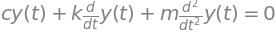

In [11]:
#
# Python code of Task 1
#
def quarterCarSolutionHomogenTest():
    global m, k, c
    m, k, c = sp.symbols('m, k, c')
    y, diff = quarterCarSolutionHomogen()
    display(y)
    print( "\n\n\n")
    display(diff)
    
quarterCarSolutionHomogenTest()

The non-homogeneous part of the differential equation depends on the function $f$, which describes the test track.
Since the rumple strip test track is represented by a sine function, the exact analytic solution can be calculated with SymPy. 

<div class="alert alert-block alert-info">
    
### Task 2: Initial value problem <font color=red>(2/2 points)</font>
Use `sympy.dsolve()` to calculate the solution of the initial value problem $(**)$ for the rumble strip test track $(*)$. 
</div>

<div class="alert alert-block alert-success">
    
<b>Solution of Task 2</b>

</div>

In [12]:
def quarterCarSolutionIVP():
    t = sp.symbols('t')
    y = sp.Function('y')(t)
    
    # Derivatives of y
    yp = sp.diff(y, t)
    ypp = sp.diff(yp, t)
    
    # Define the function f as a function of t
    f = A * sp.sin(omega * t * v)
    # Derivative of f with respect to t
    fs = sp.diff(f, t)
    
    # Define the differential equation
    differential_equation = sp.Eq(m * ypp, -c * (y - y_0 - f) - k * (yp - fs))

    # Initial conditions
    initconds = {y.subs(t, 0): y_0, yp.subs(t, 0): 0}

    # Solve the differential equation
    y_solution = sp.dsolve(differential_equation, y, ics=initconds)
    
    return y_solution

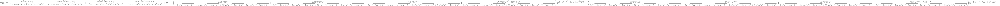

In [13]:
#
# Python code of Task 2
#
def quarterCarSolutionIVPTest():
    global m, k, c, y_0, v, A, omega
    m, k, c, y_0, v, A, omega = sp.symbols('m, k, c, y_0, v, A, omega')
    y = quarterCarSolutionIVP()
    #sp.pprint(y)

    return y

quarterCarSolutionIVPTest()

### 2.5 Numerical solution
The most basic approximation method for solving ODEs is Euler's method.
In our approach, we will only focus on this simple method.
The idea is to convert the second-order ODE into two first-order ODEs.

<div class="alert alert-block alert-info">
    
### Task 3: State variables <font color=red>(1.5/2 points)</font>
Rewrite the initial value problem $(**)$ into a system with two first-order equations using the state variables $z_0$ and $z_1$.
</div>

<div class="alert alert-block alert-success">
    
<b>Solution of Task 3</b>

$$
    \dot z_0 = z_1
$$

$$
     \text{Anfangswerte: }
     z_0 = y(0), 
     z_1 = \dot y(0)
$$

$$
    m \dot z_1 = -c(z_0 - y_0 - f(v \cdot t)) + k(z_1 - v \cdot \dot f(v \cdot t))
$$

$$
	\dot z_1 = -\frac{-c(z_0 - y_0 - f(v \cdot t)) + k(z_1 - v \cdot \dot f(v \cdot t))}{m}
$$








    










</div>

## 3 Implementation
The implementation should be flexible enough to simulate driving over different test tracks.
It is not guaranteed that the solution of the initial value problem can be exactly calculated analytically for any test track.
Thus the implementation is done with Euler's method.
For this purpose we define numerical values for all physical quantities. 
Please note that the simulation should also work if these values are changed.

In [14]:
def quarterCarNumericalValues():
    m = 150.0   # mass [kg]
    k = 300.0   # damper constant [Ns/m]
    c = 600.0   # spring constant [N/m]
    y_0 = 1.0   # equilibrium [m]
    v = 4.0     # velocity [m/s]
    return m, k, c, y_0, v

### 3.1 Test track
For the rumble strip test track we implement the function `quarterCarRoad()`.
This function not only has a single $x$-value as input argument, but a `numpy.array()` with many $x$-values.
The output consists of two arrays `f` and `fp`, which contain the corresponding function values $f(x)$ and the values of the derivative $f'(x)$ for each $x$ value. 

<div class="alert alert-block alert-info">
    
### Task 4: Rumble strip test track <font color=red>(1.5/2 points)</font>
Implement the function `quarterCarRoad()` for the rumble strip test track and test the function with a plot that shows $f(x)$ and $f'(x)$ for a simulation time of one second in a single plot.
</div>

<div class="alert alert-block alert-success">  
<b>Solution of Task 4</b>
    
Implementation of function `quarterCarRoad()`:
</div>

In [15]:
#
# Python code of Task 4
#
def quarterCarRoad(x):
    A = 0.05    # amplitude [m]
    omega = 5.0 # frequency [1/s]
    f = A * np.sin(omega * x)  
    fp = A * omega * np.cos(omega * x) 
    return f, fp

<div class="alert alert-block alert-success">  
Plot:
</div>

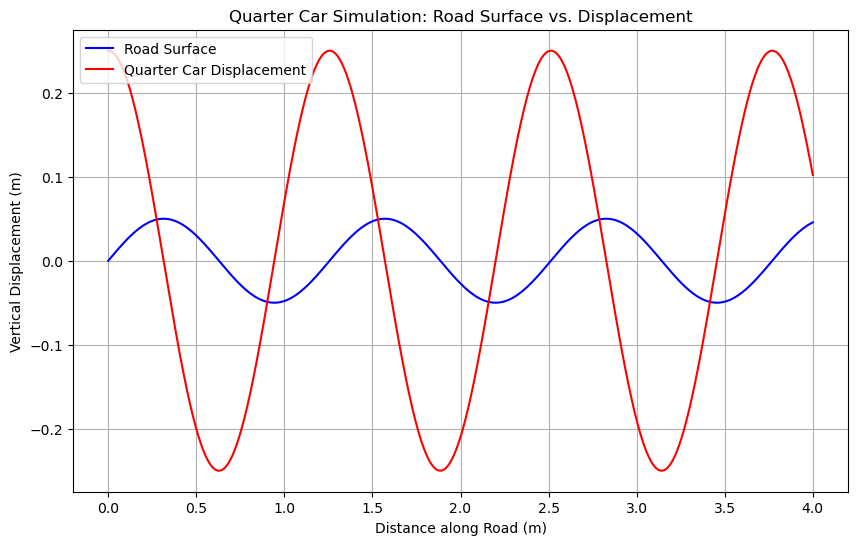

In [16]:
#
# Python code of Task 4
#
def quarterCarRoadTest():
    global m, k, c, y_0, v
    m, k, c, y_0, v = quarterCarNumericalValues()

    # Generate x values for plotting
   # x_values = np.linspace(0, 2*np.pi, 1000) #MW: Es sollte für eine Sekunde Fahrzeit geplottet werden
    x_values = np.linspace(0, v, 1000)#MW: korrigierte Version
    # Calculate the road surface and quarter car's displacement
    road_surface, quarter_car_displacement= quarterCarRoad(x_values)

    # Plot the road surface and quarter car's displacement
    plt.figure(figsize=(10, 6))
    plt.plot(x_values, road_surface, label='Road Surface', color='blue')
    plt.plot(x_values, quarter_car_displacement, label='Quarter Car Displacement', color='red')
    plt.title('Quarter Car Simulation: Road Surface vs. Displacement')
    plt.xlabel('Distance along Road (m)')
    plt.ylabel('Vertical Displacement (m)')
    plt.legend()
    plt.grid(True)
    plt.show()




    
quarterCarRoadTest()

### 3.2 Euler's method
Using the representation of the initial value problem with state variables form task 3 together with the function `quarterCarRoad()` from task 4, the system of differential equations for Euler's method can be implemented.

<div class="alert alert-block alert-info">
    
### Task 5: Quarter car ode <font color=red>(1/1 point)</font>
Implement the function `quarterCarOde()`.
</div>

<div class="alert alert-block alert-success">  
<b>Solution of Task 5</b>
    
Implementation of function `quarterCarOde()`:
</div>

In [17]:
#
# Python code of Task 5
#
def quarterCarOde(t,z):
    f, fp = quarterCarRoad(v * t)

    zp = np.array([z[1], (-c * (z[0] - y_0 - f) -k * (z[1] - v * fp)) / m])
    return zp

The basis for Euler's method is the function `quarterCarOde()`.
The step size $h$ is passed to the function for Euler's method as input argument.
The function should return the time values $t$ and the values for the oszilation of the mass $y$.

<div class="alert alert-block alert-info">
    
### Task 6: Euler's method <font color=red>(3/3 points)</font>
Implement Euler's method with the function `quarterCarEuler()` using `quarterCarOde()`.
Generete a plot which shows both, the rumble strip $f$ and the oszilation of the mass $y$ in a single plot.
</div>

<div class="alert alert-block alert-success">  
<b>Solution of Task 6</b>
    
Implementation of function `quarterCarEuler()`:
</div>

In [18]:
def quarterCarEuler(h=0.01, t0=0.0, t1=1.0):
    # Fetch necessary constants and initial conditions
    
    n = int((t1 - t0) / h)
    t = np.arange(t0, t1 + h, h)
    x = np.zeros([2, n + 1])  # Initialize a 2D array correctly
    x[:, 0] = np.array([y_0, 0.0])  # Set initial conditions for position and velocity

    for k in range(n):
        x[:, k + 1] = x[:, k] + h * quarterCarOde(t[k], x[:, k])  # Update the state for the next step

    return t, x[0, :]



<div class="alert alert-block alert-success">  
Plot:
</div>

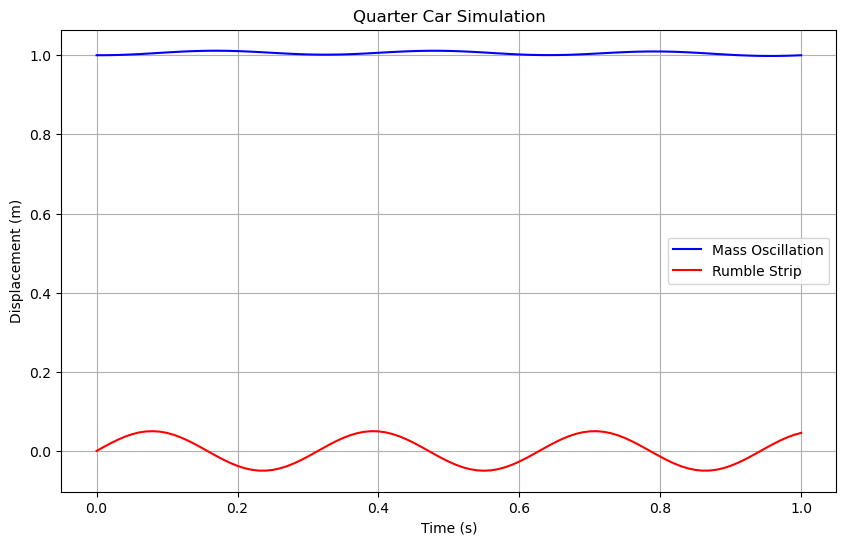

In [19]:
#
# Python code of Task 6
#
def quarterCarEulerTest():
    global m, k, c, y_0, v
    m, k, c, y_0, v = quarterCarNumericalValues()
    
    # Call quarterCarEuler to get t_values and y_values
    t_values, y_values = quarterCarEuler()
    
    # Generate data for the rumble strip f at each time step
    f_values = [quarterCarRoad(v * t)[0] for t in t_values]
    

    
    # Plotting
    plt.figure(figsize=(10, 6))
    plt.plot(t_values, y_values, label='Mass Oscillation', color='blue')
    plt.plot(t_values, f_values, label='Rumble Strip', color='red')
    
    plt.title("Quarter Car Simulation")
    plt.xlabel("Time (s)")
    plt.ylabel("Displacement (m)")
    plt.legend()
    plt.grid(True)
    plt.show()

# Call quarterCarEulerTest function to test
quarterCarEulerTest()

## 4 Visualization
To visualize a simulation of a test drive, we need a graphical representation of the road profile and the quarter vehicle.

### 4.1 Quarter car
The function `quarterCarDraw()` represents the quarter car.
It must be taken into account that the representation of the spring and damper changes dynamically due to the oscillation process.
In the state of equilibrium the center of the mass is located at a distance of $y_0$ above the roadway.
With the function `quarterCarDraw()` the model of the quarter car can be drawn at any position $x$.
The second input argument $y$ specifies the $y$ position of the mass.

In [20]:
def quarterCarDraw(x,y,f):
    
    # figure
    fig = plt.gcf()
    
    # get axis of figure
    ax = fig.gca()
    ax.axis('equal')   
        
    # wheel
    rr = 0.3; # wheel radius
    tt = np.linspace(0,2*np.pi,24)
    ax.fill(x+rr*np.cos(tt),f+rr+rr*np.sin(tt),'k')
        
    # mass
    ww = 0.6 # mass width
    hh = 0.3 # mass height
    xx = np.array([-1.0, 1.0, 1.0,-1.0,-1.0])
    yy = np.array([-1.0,-1.0, 1.0, 1.0,-1.0])
    ax.fill(x+0.5*ww*xx,y+0.5*hh*yy,'b')

    # absorber
    aa = 0.5 # absorber length
    yy = np.array([ 0.0, 0.0, 1.0, 1.0, 0.0])
    ax.fill(x+0.1*ww*xx,y-aa*yy,'r')
    ax.fill(x+0.05*ww*xx,f+rr+aa*yy,'r')

    # spring
    ll = 0.1 # spring length
    dd = (y - f - 2*ll - rr)/6.0
    xx = np.array([0.0,-rr,rr,-rr,rr,-rr,rr,0.0])
    yy = np.array([0.0,0.5,1.5,2.5,3.5,4.5,5.5,6])
    ax.plot(np.array([x,x]),f+rr+np.array([0.0,ll]),'g',linewidth=4)
    ax.plot(x+xx,f+rr+ll+dd*yy,'g',linewidth=4)
    ax.plot(np.array([x,x]),y-np.array([ll,0.0]),'g',linewidth=4)
    
    return

The position $y$ should be calculated by Euler's method before using it as input for the function `quarterCarDraw()`.

In [21]:
def quarterCarDrawTest():
    global m, k, c, y_0, v
    m, k, c, y_0, v = quarterCarNumericalValues()

    # oszilation of the mass y 
    t, y = quarterCarEuler()

    # road f
    x = v*t
    f, fp = quarterCarRoad(x)

    # figure
    fig = plt.gcf()
    fig.clf()
    fig.set_size_inches(20,5)

    # get axis of figure
    ax = fig.gca()
 
    # draw road
    ax.plot(x,f,'-b')
 
    # draw quarter car
    n = np.size(t)
    quarterCarDraw(x[n//2],y[n//2],f[n//2])
    
    return

#quarterCarDrawTest()

In [22]:
if 'google.colab' in str(get_ipython()):
    print('IFrame() does not work with Google Colab')
else:
    display(IFrame('quarter_car_rumble_strip.gif', width=720, height=180))

<div class="alert alert-block alert-info">
    
### Task 7: Animation <font color=red>(3/3 points)</font>

Implement a frame function and generate an animation video of the quarter car on the rumble strip test track.
</div>

<div class="alert alert-block alert-success">  
<b>Solution of Task 7</b>
    
Frame function:
</div>

In [23]:
def quarterCarFrame(k):
    fig.clf()

    # get axis of figure
    ax = fig.gca()

    # draw road
    ax.plot(x,f,'-b')
    ax.plot(x[:k],y[:k],'.b')

    # draw

    # draw quarter car
    quarterCarDraw(x[k],y[k],f[k])

    return

<div class="alert alert-block alert-success">  
<b>Solution of Task 7</b>
    
Generation of an animation video:
</div>

In [24]:
def quarterCarAnimation():
    global m, k, c, y_0, v, x, y, f, fig
    m, k, c, y_0, v = quarterCarNumericalValues()

    # oszilation of the mass y
    t, y = quarterCarEuler()

    # road f
    x = v*t
    f, fp = quarterCarRoad(x)

    # figure
    fig = plt.gcf()
    fig.set_size_inches(20,5)

    return FuncAnimation(fig, quarterCarFrame, frames=np.arange(1,100))

display(HTML(quarterCarAnimation().to_jshtml()))

# close figure
plt.close(plt.gcf())

## 5 Evaluation
In the simulation of the quarter car, the differences between verification and validation can be clearly illustrated when evaluating a simulation.   
During verification, we check whether the results of the calculations are in line with our theoretical model.
The task of validation is to assess the extent to which this simulation allows conclusions to be drawn about the vehicle's driving dynamics.

### 5.1 Verification
With simulations based on numerical solution methods, the question arises as to how reliable the numerical approximate values are.
The accuracy of Euler's method depends mainly on the step size $h$.
One needs small step sizes in order to solve the problem with a corresponding accuracy.
On the other hand, small step sizes require considerably more steps and thus more calculation operations.
This increases the computing time required to run a simulation.
A further disadvantage of small step sizes is the rounding error problem.

The trick is now to determine a step size optimally adapted to the problem.
The determination of optimal step sizes is a central topic of numerical mathematics.
However, this determination requires a deeper understanding of numerical approximation methods.
We are therefore content with an experimental consideration.
For a sinusoidal road profile, we have already implemented the calculation of the exact symbolic solution, see `quarterCarSolutionIVP()`.
Thus we can compare the numerically calculated approximate values with the analytically determined exact solution for this road profile.

The idea is to use SymPy as a code generator for the exact analytical solution.
The function `quarterCarAnalytic()` should be implemented according to the function `quarterCarEuler()`.
The step size $h$ is passed as input argument to the function.
The function should return the time values $t$ and the values for the oszilation of the mass $y$.

<div class="alert alert-block alert-info">
    
### Task 8: Code generation <font color=red>(2/2 points)</font>

Use `sympy.lambdify()`, `quarterCarNumericalValues()` and `quarterCarSolutionIVP()` to implement the function `quarterCarAnalytic()`.
</div>

<div class="alert alert-block alert-success">  
<b>Solution of Task 8</b>
    
Implementation of 'quarterCarAnalytic()`:
</div>

In [25]:
def quarterCarAnalytic(h=0.01, t0=0.0, t1=1.0):
    # Unpack only the values returned by quarterCarNumericalValues()
    m, k, c, y_0, v = quarterCarNumericalValues()

    #MW: Man braucht hier gar keine Symbols zu definieren, sondern kann gleich
    # it den numerischen Werten in die Funktion quarterCarSolutionIVP gehen
    # Define the symbolic variables, assuming A and omega are defined globally
    #sm, sk, sc, sy_0, sv, sA, somega, st = sp.symbols('m k c y_0 v A omega t')

    # Assuming quarterCarSolutionIVP() returns a sympy expression with a 'rhs' representing the solution
    solution_expr = quarterCarSolutionIVP().rhs

    #MW: Wenn man oben mit den numerischen Werten reingeht, spart man die ganzen subs...
    # Substitute the numerical values into the equation, using the globally defined A and omega
    #f = sp.lambdify(st, solution_expr.subs([
     #   (sm, m),
     #   (sk, k),
     #   (sc, c),
     #   (sy_0, y_0),
      #  (sv, v),
     #   (sA, A),  # A is taken from the global scope
      #  (somega, omega),  # omega is taken from the global scope
    #]))

    
    f = sp.lambdify('t',solution_expr) #MW: ... und so kurz wird es dann! :-)
    
    
    # Generate time points and evaluate the solution
    n = int((t1 - t0) / h)
    t = np.linspace(t0, t1, n + 1)
    y = f(t)
    return t, y

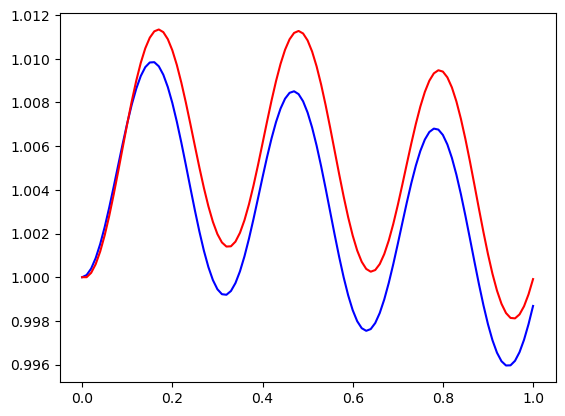

In [26]:
def quarterCarAnalyticTest():
    global m, k, c, y_0, v, A, omega
    m, k, c, y_0, v = quarterCarNumericalValues()
    A = 0.05
    omega = 5.0

    t1, y1 = quarterCarAnalytic()
    t2, y2 = quarterCarEuler()
    plt.plot(t1,y1,'-b',t2,y2,'-r')

quarterCarAnalyticTest()

<div class="alert alert-block alert-info">
    
### Task 9: Step size <font color=red>(1/1 point)</font>
Use the functions `quarterCarEuler()` and `quarterCarAnalytic()` to determine the maximum deviation of the numerical approximate values from the exact analytical solution.
For this purpose use the step sizes $h=0.01$, $h=0.001$ and $h=0.0001$. 
</div>

<div class="alert alert-block alert-success">  
<b>Solution of Task 9</b>
    
Maximum deviation of the numerical approximate values from the exact analytical solution:
</div>

In [27]:
def quarterCarStepSize():
    # Ensure all required values are defined or passed as parameters
    m, k, c, y_0, v = quarterCarNumericalValues()  # Assuming this function returns the necessary parameters
    A = 0.05
    omega = 5.0

    # Initialize the dictionary for maximum deviations
    max_deviations = {}

    for h in [0.01, 0.001, 0.0001]:
        # Calculate the numerical approximate values
        t_numerical, y_numerical = quarterCarEuler(h=h)
        
        # Calculate the exact analytical solution
        t_exact, y_exact = quarterCarAnalytic(h=h)

        # Calculate the deviation for each time step
        deviation = np.abs(y_numerical - y_exact)

        # Update the maximum deviation if necessary
        if h not in max_deviations:
            max_deviations[h] = np.max(deviation)
        else:
            max_deviations[h] = max(max_deviations[h], np.max(deviation))

    # Display the results
    for h, dev in max_deviations.items():
        print(f"Max deviation for step size={h} is {dev}")

    return max_deviations

quarterCarStepSize()

Max deviation for step size=0.01 is 0.003848118856534022
Max deviation for step size=0.001 is 0.0003821811552306986
Max deviation for step size=0.0001 is 3.819035920193947e-05


In simulations based on numerical solutions of differential equations, the calculations are often performed using Runge-Kutta methods.
Compared to Euler's method, higher order Runge-Kutta methods produce more accurate results.
In addition, Runge-Kutta methods offer good methods for error estimation and, based on these, mechanisms for automatic step size control.

### 5.2 Validation
A further aspect in the evaluation is the question of whether the simulation actually provides usable results for vehicle dynamics.
It should be kept in mind that the quarter car only provides a rough model, in which some important factors, such as the stiffness of the entire vehicle or the distribution of the mass to the individual wheels, are not taken into account.

## 6 Embedding
It would be nice to have a graphical user interface for embedding the simulation.
This user interface could offer a selection of different road profiles for selection and take over the configuration of the parameters of the quarter car.
A graphical editor for creating different road profiles would be helpful.  

In [28]:
if 'google.colab' in str(get_ipython()):
    print('IFrame() does not work with Google Colab')
else:
    display(IFrame('quarter_car_ramp.gif', width=720, height=180))

<div class="alert alert-block alert-info">
    
## Task 10: Ramp test track <font color=red>(2/2 points)</font>
A test track with a ramp can be simulated by the function
    
$$
    f(x) = \left\{
    \begin{array}{ccl}
        0        & \mbox{ for } & x \leq 1,\\
        0.2(x-1) & \mbox{ for } & 1 < x \leq 2,\\
        0.2      & \mbox{ for } & x > 2.\\
    \end{array}
    \right.
$$
    
Reimplement the function `quarterCarRoad()` and generate an animation video of the quarter car on the test track with this ramp.
</div>

<div class="alert alert-block alert-success">  
<b>Solution of Task 10</b>
    
Reimplementation of the function `quarterCarRoad()` :
</div>

In [29]:
#
# Python code of Task 10
#
def quarterCarRoad(x):
    if isinstance(x, np.ndarray):
        f = np.piecewise(x, [x <= 1, (1 < x) & (x <= 2), x > 2], [0, lambda x: 0.2 * (x - 1), 0.2])
        # calculate the derivative of f
        fp = np.gradient(f)
    else:
        if x <= 1:
            f = 0.0
            fp = 0.0
        elif 1 < x <= 2:
            f = 0.2 * (x - 1)
            fp = 0.2
        else:
            f = 0.2
            fp = 0.0
    return f, fp



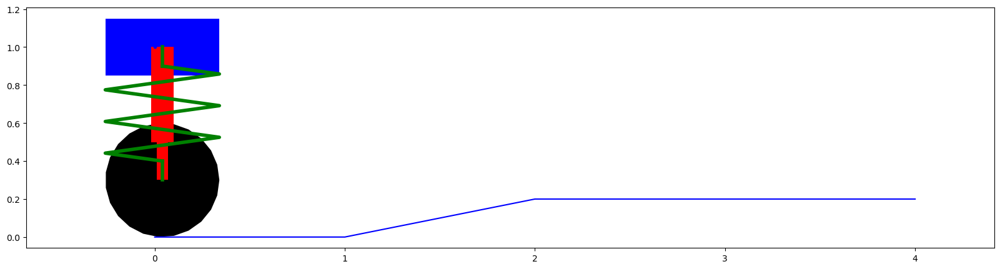

In [30]:
display(HTML(quarterCarAnimation().to_jshtml()))
# close figure
#plt.close(plt.gcf())

## Literature
 - [https://en.wikipedia.org/wiki/Vehicle_dynamics](https://en.wikipedia.org/wiki/Vehicle_dynamics)
 - [https://en.wikipedia.org/wiki/Euler_method](https://en.wikipedia.org/wiki/Euler_method)
 - [https://en.wikipedia.org/wiki/Runge-Kutta_methods](https://en.wikipedia.org/wiki/Runge-Kutta_methods)
 - [J.Koch, M.Stämpfle: Mathematik für das Ingenieurstudium](https://www.hanser-fachbuch.de/buch/Mathematik+fuer+das+Ingenieurstudium/9783446451667)

In [31]:
# Define the Car class
class Car:
    def __init__(self, make, model, year):
        self.make = make
        self.model = model
        self.year = year
        self.speed = 0

    def start(self):
        return f"The {self.make} {self.model} is starting."

    def stop(self):
        return f"The {self.make} {self.model} is stopping."

    def accelerate(self):
        self.speed += 5
        return f"The {self.make} {self.model} is accelerating. Current speed: {self.speed} km/h"

# Create a car object
my_car = Car("Tesla", "Model S", 2020)

# Simulate car operations
print(my_car.start())
print(my_car.accelerate())
print(my_car.stop())

The Tesla Model S is starting.
The Tesla Model S is accelerating. Current speed: 5 km/h
The Tesla Model S is stopping.


NameError: name 'animation' is not defined

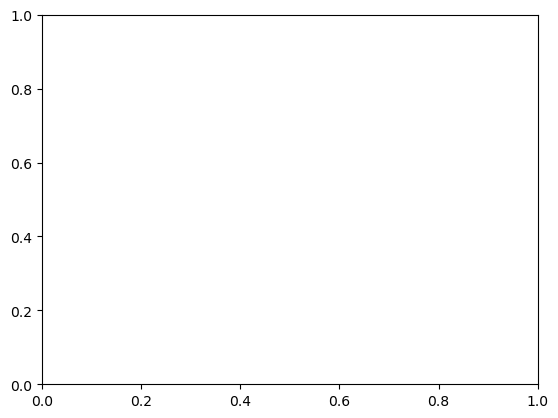

In [32]:

# Create a figure and axes
fig, ax = plt.subplots()

# Create a rectangle that represents the car
car = plt.Rectangle((0, 0), 0.1, 0.1, fc='blue')

def init():
    ax.add_patch(car)
    ax.set_xlim(0, 5)
    ax.set_ylim(0, 5)
    return car,

def animate(i):
    car.set_x(i * 0.1)
    return car,

anim = animation.FuncAnimation(fig, animate, init_func=init, frames=50, interval=200, blit=True)

plt.show()

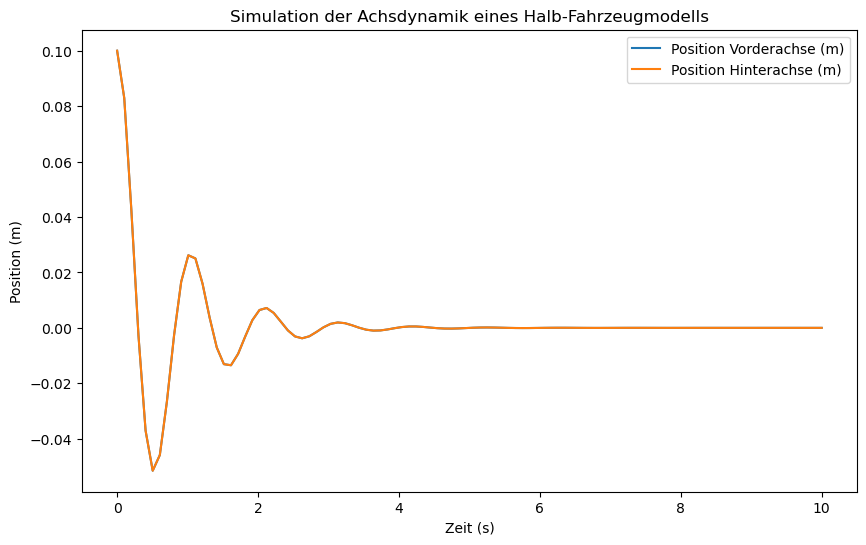

In [33]:
import numpy as np
from scipy.integrate import solve_ivp

# Fahrzeugparameter
m_vorne = 400  # Masse der Vorderachse in kg
m_hinten = 400  # Masse der Hinterachse in kg
k_vorne = 15000  # Federkonstante vorne in N/m
k_hinten = 15000  # Federkonstante hinten in N/m
c_vorne = 1000  # Dämpfungskonstante vorne in Ns/m
c_hinten = 1000  # Dämpfungskonstante hinten in Ns/m

# Anfangsbedingungen
y0_vorne = 0.1  # Anfangsauslenkung vorne in m
y0_hinten = 0.1  # Anfangsauslenkung hinten in m
v0_vorne = 0  # Anfangsgeschwindigkeit vorne in m/s
v0_hinten = 0  # Anfangsgeschwindigkeit hinten in m/s

# Differentialgleichungen
def model(t, y):
    y_vorne, v_vorne, y_hinten, v_hinten = y
    dydt_vorne = v_vorne
    dvdt_vorne = (-c_vorne * v_vorne - k_vorne * y_vorne) / m_vorne
    dydt_hinten = v_hinten
    dvdt_hinten = (-c_hinten * v_hinten - k_hinten * y_hinten) / m_hinten
    return [dydt_vorne, dvdt_vorne, dydt_hinten, dvdt_hinten]

# Zeitbereich für die Simulation
t_span = [0, 10]  # 10 Sekunden lange Simulation
y0 = [y0_vorne, v0_vorne, y0_hinten, v0_hinten]  # Anfangsbedingungen

# Löse das System der Differentialgleichungen
sol = solve_ivp(model, t_span, y0, method='RK45', t_eval=np.linspace(0, 10, 100))

# Ergebnisse
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(sol.t, sol.y[0], label='Position Vorderachse (m)')
plt.plot(sol.t, sol.y[2], label='Position Hinterachse (m)')
plt.xlabel('Zeit (s)')
plt.ylabel('Position (m)')
plt.title('Simulation der Achsdynamik eines Halb-Fahrzeugmodells')
plt.legend()
plt.show()


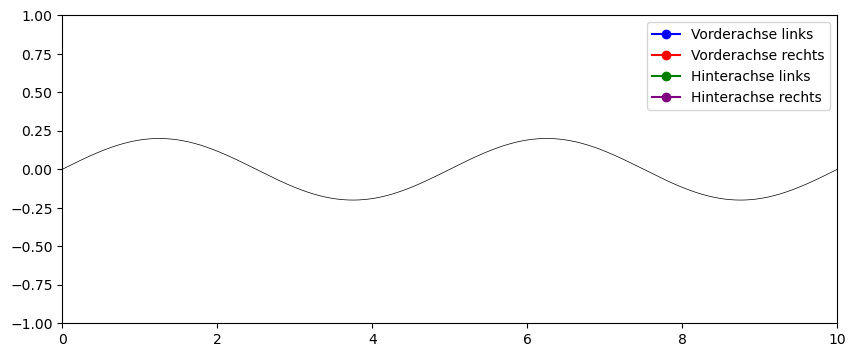

In [34]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Beispielwerte, falls Sie keine eigenen Daten haben
t = np.linspace(0, 10, 100)
y_vorne_links = 0.1 * np.cos(2 * np.pi * 0.5 * t)  # Beispielbewegung der Vorderachse links
y_vorne_rechts = 0.1 * np.cos(2 * np.pi * 0.5 * t + np.pi / 2)  # Beispielbewegung der Vorderachse rechts
y_hinten_links = 0.1 * np.sin(2 * np.pi * 0.5 * t)  # Beispielbewegung der Hinterachse links
y_hinten_rechts = 0.1 * np.sin(2 * np.pi * 0.5 * t + np.pi / 2)  # Beispielbewegung der Hinterachse rechts

fig, ax = plt.subplots(figsize=(10, 4))
ax.set_xlim(0, 10)
ax.set_ylim(-1, 1)

# Hügelige Bahn
x_bahn = np.linspace(0, 10, 1000)
y_bahn = 0.2 * np.sin(2 * np.pi * 0.2 * x_bahn)
ax.plot(x_bahn, y_bahn, color='black', linewidth=0.5)  # Bodenlinie

line_vorne_links, = ax.plot([], [], 'o-', color='blue', label='Vorderachse links')  # Rad und Feder vorne links
line_vorne_rechts, = ax.plot([], [], 'o-', color='red', label='Vorderachse rechts')  # Rad und Feder vorne rechts
line_hinten_links, = ax.plot([], [], 'o-', color='green', label='Hinterachse links')  # Rad und Feder hinten links
line_hinten_rechts, = ax.plot([], [], 'o-', color='purple', label='Hinterachse rechts')  # Rad und Feder hinten rechts

def init():
    line_vorne_links.set_data([], [])
    line_vorne_rechts.set_data([], [])
    line_hinten_links.set_data([], [])
    line_hinten_rechts.set_data([], [])
    return line_vorne_links, line_vorne_rechts, line_hinten_links, line_hinten_rechts,

# Initialize v, x, and dt
v = 0
x = 0
dt = t[1] - t[0]  # time difference between two frames

def update(frame):
    # Constants
    global v, x  # declare v and x as nonlocal variables
    g = 9.81  # Gravity
    m = 1000  # Mass of the car
    k = 10000  # Spring constant of the suspension system
    c = 1000  # Damping constant of the suspension system
    F_engine = 1000  # Engine force

    # Calculate the forces acting on the car
    F_gravity = m * g
    F_spring = k * (y_bahn[frame] - y_vorne_links[frame])
    F_damper = c * (v - (y_bahn[frame] - y_vorne_links[frame]) / dt)
    F_total = F_engine - F_gravity - F_spring - F_damper

    # Calculate the acceleration of the car
    a = F_total / m

    # Update the velocity and position of the car
    v = v + a * dt
    x = x + v * dt

    # Calculate the suspension force
    F_suspension = -k * (y_vorne_links[frame] - y_bahn[frame]) - c * (v - (y_bahn[frame] - y_vorne_links[frame]) / dt)

    # Update the position of the wheel based on the suspension force
    y_vorne_links[frame] = y_vorne_links[frame] + F_suspension / m * dt

    # Update the position of the wheels
    x_vorne_links = [x, x]
    y_vorne_links_pos = [y_bahn[frame], y_vorne_links[frame] + y_bahn[frame]]

    # Update the data of the line
    line_vorne_links.set_data(x_vorne_links, y_vorne_links_pos)

    return line_vorne_links,

anim = FuncAnimation(fig, update, frames=len(t), init_func=init, blit=True)
plt.legend()
HTML(anim.to_jshtml())

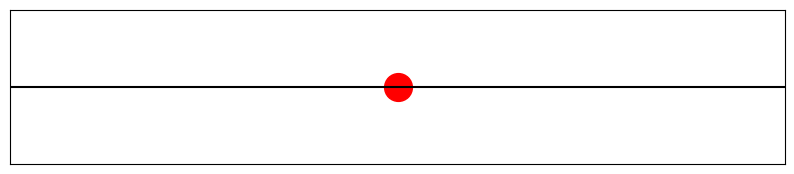

In [35]:
import ipywidgets as widgets
from IPython.display import display, clear_output
import matplotlib.pyplot as plt
from ipyevents import Event

# Initial position of the car
position = 0
# Initial suspension force
F_suspension = 0

def handle_key_event(event):
    global position
    if event['key'] == 'ArrowRight':
        position += 1
    elif event['key'] == 'ArrowLeft':
        position -= 1
    elif event['key'] == 'ArrowUp':
        position += 0.1  # Increase the position slightly when the up arrow key is pressed
    elif event['key'] == 'ArrowDown':
        position -= 0.1  # Decrease the position slightly when the down arrow key is pressed
    display_car()

def display_car():
    clear_output(wait=True)
    plt.figure(figsize=(10, 2))
    plt.xlim(-10, 10)
    plt.ylim(-1, 1)
    
    # Calculate the y-coordinate of the car based on the suspension force
    y = F_suspension / 1000  # Scale the suspension force for better visualization
    
    plt.plot(position, y, 'ro', markersize=20)  # Car as a red circle
    plt.axhline(0, color='black')  # "Road"
    plt.grid(True)
    plt.gca().axes.get_yaxis().set_visible(False)
    plt.gca().axes.get_xaxis().set_visible(False)
    plt.show()

# Text widget to capture keyboard inputs
text_input = widgets.Text(value='', placeholder='Click here and use the arrow keys!', description='Control:', disabled=False)

# Event listener for keyboard inputs
event = Event(source=text_input, watched_events=['keydown'])
event.on_dom_event(handle_key_event)

# Display the text widget and the car
display(text_input)
display_car()

In [36]:
try:
    from ipyevents import Event
    print("ipyevents erfolgreich geladen!")
except ImportError as e:
    print("ipyevents konnte nicht geladen werden:", e)


ipyevents erfolgreich geladen!


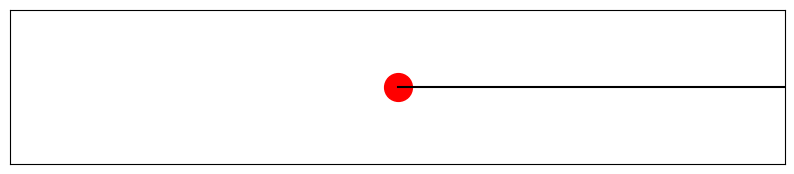

In [37]:
import ipywidgets as widgets
from IPython.display import display, clear_output
import matplotlib.pyplot as plt
from ipyevents import Event
import numpy as np

# Initial position of the car
position = 0
# Initial suspension force
F_suspension = 0
# Road profile
road_profile = np.zeros(100)

def handle_key_event(event):
    global position, road_profile
    if event['key'] == 'ArrowRight':
        position += 1
    elif event['key'] == 'ArrowLeft':
        position -= 1
    elif event['key'] == 'ArrowUp':
        # Increase the road profile at the current position when the up arrow key is pressed
        if position < len(road_profile):
            road_profile[position] += 0.1
    elif event['key'] == 'ArrowDown':
        # Decrease the road profile at the current position when the down arrow key is pressed
        if position < len(road_profile):
            road_profile[position] -= 0.1
    display_car()

def display_car():
    clear_output(wait=True)
    plt.figure(figsize=(10, 2))
    plt.xlim(-10, 10)
    plt.ylim(-1, 1)
    
    # Calculate the y-coordinate of the car based on the suspension force
    y = F_suspension / 1000  # Scale the suspension force for better visualization
    
    plt.plot(position, y, 'ro', markersize=20)  # Car as a red circle
    plt.plot(range(len(road_profile)), road_profile, color='black')  # "Road"
    plt.grid(True)
    plt.gca().axes.get_yaxis().set_visible(False)
    plt.gca().axes.get_xaxis().set_visible(False)
    plt.show()

# Text widget to capture keyboard inputs
text_input = widgets.Text(value='', placeholder='Click here and use the arrow keys!', description='Control:', disabled=False)

# Event listener for keyboard inputs
event = Event(source=text_input, watched_events=['keydown'])
event.on_dom_event(handle_key_event)

# Display the text widget and the car
display(text_input)
display_car()